## I2b2 dataset
Contents of the 2018 Task2 challenge:  
This dataset was created to identify Adverse Drug Events and Medication Extraction in EHRs. This challenge focused on three tasks:
- Identifying concepts: drug names, dosages, durations, etc.  
- Identifying relations: relation of drugs with ADE's and other entities given gold standard entities (generated by human annotators). 
- Running an end-to-end model that identifies relation of drugs with ADE's and other entittes on system predicted entitites.  

See documentation for more details.  

The training data is composed of individual notes (.txt extension) and corresponding individual annotation files (.ann extension).   
Annotation files contain tags (labeled with a leading 'T') and relations (labeled with a leading 'R'):
- For tags, the structure is: Tag_id, Tag_entity, Start_character_loc, End_character_loc  
- For relations, the structure is: Relation_id, Relation_entity, Arg1:Tag_id, Arg2:Tag_id  

In [2]:
import pandas as pd
import i2b2_evaluate as i2b2e
import glob, os
import sys, io
import re
import matplotlib.pyplot as plt
import numpy as np
import nltk
import statistics as stats
import itertools
from nltk.tokenize import sent_tokenize 
%matplotlib inline

In [3]:
#test_path = '/Users/valeriemeausoone/Documents/W266/github_repo/w266_final/data/i2b2/2018/training_20180910/training_20180910/100035.ann'
file_path = '/Users/valeriemeausoone/Documents/W266/github_repo/w266_final/data/i2b2/2018/training_20180910/training_20180910/'

In [4]:
os.chdir(file_path)

### Average length of documents

In [4]:
#len_docs=[nltk.tokenize(file) for file in glob.glob("*.txt")]

In [5]:
import tokenize
len_docs=[]
for file in glob.glob("*.txt"):
    #print(file)
    with open(file, 'rb') as f:
        text=f.read()
        tokens = nltk.tokenize.word_tokenize(str(text))
        len_docs.append(len(tokens))

In [6]:
print(stats.mean(len_docs))
print(min(len_docs))
print(max(len_docs))

2208.108910891089
114
7430


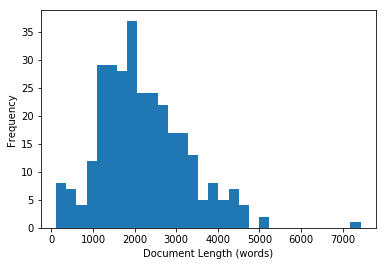

In [7]:
np.random.seed(42)
x = len_docs
plt.hist(x, density=False, bins=30)  # `density=False` would make counts
plt.ylabel('Frequency')
plt.xlabel('Document Length (words)');

In [8]:
#test_record = i2b2e.RecordTrack2(test_path)
#print(i2b2e.RecordTrack2(test_path).tags)
#print(i2b2e.RecordTrack2(test_path).relations)

### Tags

In [9]:
tags_list = [i2b2e.RecordTrack2(file).tags for file in glob.glob("*.ann")]

In [10]:
tags_values = []
for dict_tags in tags_list:
    tags_values.extend(list(dict_tags.values()))

In [11]:
len(tags_values)

50951

In [12]:
tag_type = []
tag_entity=[]
#for tags in range(len(tags_values)):
for item in list(range(len(tags_values))):
    #print(tags_values[item])
    old_stdout = sys.stdout
    new_stdout = io.StringIO()
    sys.stdout = new_stdout
    print(tags_values[item])
    output = new_stdout.getvalue()
    tag_type.append(output.split('\t')[0])
    tag_entity.append(output.split('\t')[1])

([0, 1, 2, 3, 4, 5, 6, 7, 8], <a list of 9 Text xticklabel objects>)

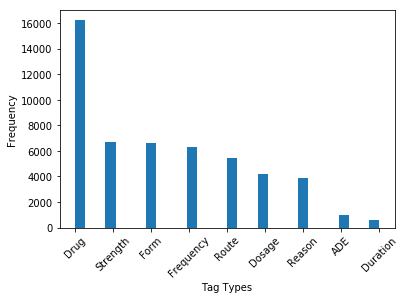

In [22]:
np.random.seed(42)
x = tag_type
plt.hist(x, density=False, bins=30)  # `density=False` would make counts
plt.ylabel('Frequency')
plt.xlabel('Tag Types')
plt.xticks(rotation=45)

In [14]:
pd.Series(tag_entity).value_counts()

Tablet                            3111
PO                                3100
One (1)                           1943
daily                              821
Capsule                            514
IV                                 506
DAILY (Daily)                      497
once a day                         368
Two (2)                            340
20 mg                              326
DAILY                              325
1                                  294
10 mg                              284
100 mg                             284
40 mg                              257
5 mg                               256
BID                                230
pain                               230
BID (2 times a day)                225
coumadin                           217
by mouth                           213
25 mg                              205
500 mg                             199
twice a day                        197
po                                 192
Solution                 

### Relations

In [15]:
relations_list = [i2b2e.RecordTrack2(file).relations for file in glob.glob("*.ann")]
relations_values = []
for dict_relations in relations_list:
    relations_values.extend(list(dict_relations.values()))

In [16]:
len(relations_values)

36348

In [17]:
relation_type = []
#for tags in range(len(tags_values)):
for item in list(range(len(relations_values))):
    #print(tags_values[item])
    old_stdout = sys.stdout
    new_stdout = io.StringIO()
    sys.stdout = new_stdout
    print(relations_values[item])
    output = new_stdout.getvalue()
    relation_type.append(output.split(' ')[0])
   # relation_entity.append(output.split('\t')[1])

([0, 1, 2, 3, 4, 5, 6, 7], <a list of 8 Text xticklabel objects>)

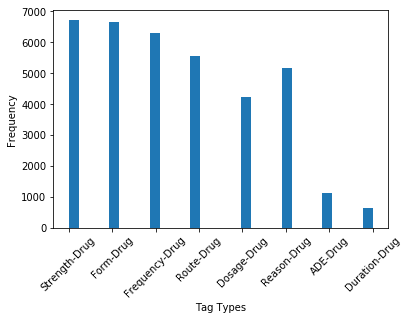

In [20]:
np.random.seed(42)
x = relation_type
plt.hist(x, density=False, bins=30)  # `density=False` would make counts
plt.ylabel('Frequency')
plt.xlabel('Tag Types')
plt.xticks(rotation=45)

# Preparing data for BioBert

Processing n2c2 data requires us to process discharge summaries, which are messy. Our strategy will be as follows:
1. Implement a manual strategy for identifying discharge summary sections
2. Detect sentence boundaries
3. Tokenize
4. Do POS tagging

### 1. Clinical discharge summary sections

In [26]:
file_path = '/Users/valeriemeausoone/Documents/W266/github_repo/w266_final/data/i2b2/2018/training_20180910/training_20180910/'

In [27]:
os.chdir(file_path)

In [16]:
with open("110727.txt", 'rb') as f:
    text=f.read().decode("utf-8")
    print(text)

Admission Date:  [**2202-1-8**]              Discharge Date:   [**2202-2-1**]

Date of Birth:  [**2163-9-18**]             Sex:   M

Service: MEDICINE

Allergies:
Keflex / Orencia / Remicade

Attending:[**First Name3 (LF) 2751**]
Chief Complaint:
L leg pain and erythema

Major Surgical or Invasive Procedure:
IR guided fluid drainage
Incision and drainage
Muscle biopsy


History of Present Illness:
 Mr. [**Known lastname 17385**] is a 38 y.o. male with a history of psoriatic
arthritis on immunosuppresive therapy, HTN, HL, DM, cervicogenic
headaches who was recently discharged on [**1-8**] for left leg pain.
Pt reprots that he presented to the ED on [**2202-1-3**] for L heel pain
radiating to knees. He was initially treated with vanc and cipro
for question of septic left knee; the aspirate showed [**Numeric Identifier **] WBC
and 94% PMN but neg gram stain and culture and no crystals so
abx discontinued. LENI was negative for DVT or [**Hospital Ward Name **] cyst. No
fx on x-ray. This wa

## Inspecting Sections - ENDED UP NOT IMPLEMENTING

In [5]:
list_sections=[]
for file in glob.glob("*.txt"):
    with open(file, 'rb') as f:
        text=f.read().decode("utf-8")
        sections = list(set(re.findall(r'([a-zA-Z ]*[:])', text)))
        list_sections.extend(sections)

list_sections = [ element.lower().strip() for element in list_sections]

In [6]:
import collections
counter=collections.Counter(list_sections)
print(counter.most_common(100))

[('admission date:', 303), ('discharge date:', 303), ('service:', 303), ('allergies:', 298), (':', 298), ('past medical history:', 288), ('history of present illness:', 285), ('social history:', 282), ('discharge medications:', 279), ('discharge disposition:', 279), ('attending:', 278), ('physical exam:', 277), ('discharge diagnosis:', 276), ('discharge condition:', 274), ('medications on admission:', 274), ('chief complaint:', 274), ('brief hospital course:', 272), ('family history:', 271), ('major surgical or invasive procedure:', 270), ('discharge instructions:', 269), ('sex:', 268), ('date of birth:', 267), ('followup instructions:', 267), ('pertinent results:', 263), ('heent:', 222), ('mg tablet sig:', 203), ('impression:', 173), ('sig:', 166), ('neuro:', 165), ('facility:', 164), ('neck:', 158), ('ext:', 157), ('completed by:', 148), ('cv:', 140), ('refills:', 140), ('mg capsule sig:', 131), ('disp:', 130), ('lungs:', 121), ('general:', 119), ('abd:', 114), ('mental status:', 113

In [7]:
x = counter.most_common(100)

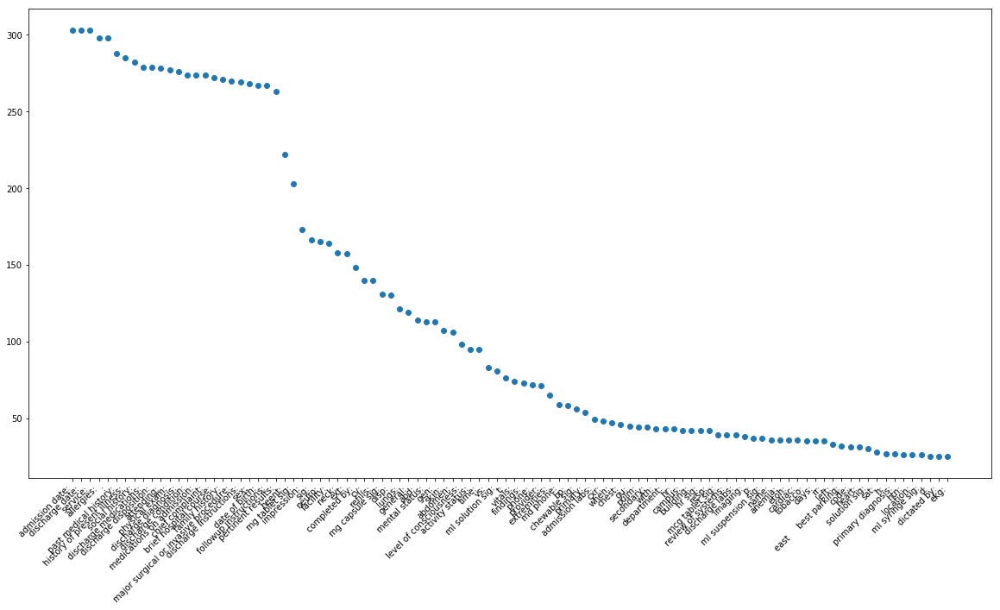

In [8]:
import matplotlib.pyplot as plt
from math import log
#testList2 = [(elem1, elem2) for elem1, elem2 in x]
plt.figure(figsize=(20,10))
plt.scatter(*zip(*x))
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
### DID NOT END UP IMPLEMENTING THIS
sections = []
for file in glob.glob("*.txt"):
    #replace with specific file
    with open('110727.txt', 'rb') as f:
        text=f.read().decode("utf-8").lower()
        #identify tags here
        for section in x:
            start = section[0]
            end = '\n\n'
            try:
                text_section = text.split(start)[1].split(end)[0]
                #print(text)
                sections.append(text_section)
            except:
                pass
        #now tokenize

In [ ]:
sent_sections = []
for section in sections:
    output = sent_tokenize(section) 
    sent_sections.extend(output)

In [50]:
for sentence in sent_sections:
    print("NEW SENTENCE")
    print(sentence)
    print(" ")

NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when pt presented with a
few lesions of psoriasis and symmetric polyarticular swelling of
mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].
 
NEW SENTENCE
started simponi in [**2201-8-27**].
 
NEW SENTENCE
-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary t

dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 clear and coherent
level of consciousness: alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE
 alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE
 ambulatory - requires assistance or aid
 
NEW SENTENCE
[**2202-2-1**]
8:00
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
ext

NEW SENTENCE
2. azathioprine 50 mg tablet
 
NEW SENTENCE
 aaox3, strength 5/5 in le.
 
NEW SENTENCE

[**first name5 (namepattern1) 189**] [**last name (namepattern1) 269**]
 
NEW SENTENCE
 supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hy

-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE

 mr. [**known lastname 17385**] is a 38 y.o.
 
NEW SENTENCE
male with a history of psoriatic
arthritis on immunosuppresive therapy, htn, hl, dm, cervicogenic
headaches who was recently discharged on [**1-8**] for left leg pain.
 
NEW SENTENCE
pt reprots that he presented to the ed on [**2202-1-3**] for l heel pain
radiating to knees.
 
NEW SENTENCE
he was initially treated with vanc and cipro
for question of septic left knee; the aspirate showed [**numeric identifier **] wbc
and 94% pmn but neg gram stain and culture and no crysta

 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE
 prednisone-ind

 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when pt presented with a
few lesions of psoriasis and symmetric polyarticular swelling of
mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].

 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SENTENCE
# medication overdose: on [**2202-1-26**], on recommendation from the
pain service, patient's ms contin dose was increased to 160 mg
tid from 130 mg tid, in addition to being ordered for prn
dilaudid.
 
NEW SENTENCE
later that night, pt fell while ambulating.
 
NEW SENTENCE
he had a
ct scan which was negative for acute intracranial pathologu.
 
NEW SENTENCE
morning after the fall, pt was noted to be somnolent and
hypotensive.
 
NEW SENTENCE
he was given naloxone 0.4 mg x3 and would arouse
briefly after each dose.
 
NEW SENTENCE
he continued to be hypotensive after a
bolus of 1l of ns.
 
NEW SENTENCE
he was transferred to the micu for further
monitoring.
 
NEW SENTENCE
in the micu he was monitor

he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SENTENCE
# medication overdose: on [**2202-1-26**], on recommendation from the
pain service, patient's ms contin dose was increased to 160 mg
tid from 130 mg tid, in addition to being ordered for prn
dilaudid.
 
NEW SENTENCE
later that night, pt fell while ambulating.
 
NEW SENTENCE
he had a
ct scan which was negative for acute intracranial pathologu.
 
NEW SENTENCE
morning after the fall, pt was noted to be somnolent and
hypotensive.

ct scan which was negative for acute intracranial pathologu.
 
NEW SENTENCE
morning after the fall, pt was noted to be somnolent and
hypotensive.
 
NEW SENTENCE
he was given naloxone 0.4 mg x3 and would arouse
briefly after each dose.
 
NEW SENTENCE
he continued to be hypotensive after a
bolus of 1l of ns.
 
NEW SENTENCE
he was transferred to the micu for further
monitoring.
 
NEW SENTENCE
in the micu he was monitored closely and his
hypotension and mental status gradually improved.
 
NEW SENTENCE
he was called
out back to the floor on [**2202-1-28**].
 
NEW SENTENCE
he never required intubation.
 
NEW SENTENCE
after being called out, he was normotensive and alert and
oriented x 3. it was believed his hypotension and altered mental
status were caused by medication overdose in the setting of
acute kidney injury.
 
NEW SENTENCE
he was discharged on oxycodone 5mg q4
hours, which he did well on for the 3 days prior to his
discharge.
 
NEW SENTENCE
he will follow up with the pain clinic as 

NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NE

supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint 

NEW SENTENCE
 prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when 

lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but

.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture 

 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location

 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mi

NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna s

 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE
 prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
N

[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets 

NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]   

 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE
 prednisone-induced
-dm2: pred

2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are

 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
 

NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE

idiopathic spondylarthropathy
cellulitis
hypotension in the setting of narcotic overdose
psoriatic arthritis
acute renal failure
gerd
osa
dm
htn
hl
 
NEW SENTENCE

mental status: clear and coherent
level of consciousness: alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE

prednisone 60mg po daily
golimumab (simponi) 50mg sq monthly
azathioprine 150mg po qam, 100mg po qpm
indomethacin 50mg po tid
ms contin 60mg [**hospital1 **]
gabapentin 300mg tid
dilaudid 4-8mg q8h prn pain
donnatal 16.2mg 1-2 tabs po qid prn for dyspepsia
alendronate 35mg po qsunday
calcium 500mg daily
vitamin d2 50,000 unit capsule po 3x per week (t/th/f)
bactrim ds 1 tab 3x per week (m/w/f)
clobetasol 0.05% to scalp [**hospital1 **] on weekends
levemir 8u qam, 10u qpm
aspart based on carb counting
asa 81mg po daily
hctz 25mg po daily
lisinop

montelukast 4mg po daily
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE

38 years old male with psoriatic arthritis on immunosuppression,
dm, htn, hl p/w lle erythema, swelling and pain, found to have
gastrocnemius abscesses and overlying cellulitis.
 
NEW SENTENCE
.
 
NEW SENTENCE
# acute renal failure: patient noted to have acutely elevated
creatinine after i&d by surgery.
 
NEW SENTENCE
all urine lytes testing
indicated pre-renal etiology.
 
NEW SENTENCE
resolved after fluid challenge.
 
NEW SENTENCE
he
again had acute renal failure on [**2202-1-27**] in the setting of having
received increased doses of pain medications and resultant
hypoperfusion.
 
NEW SENTENCE
his peak creatinine was 3.0, and resolved to his
baseline of 0.8-0.9 by the time of discharge.
 
NEW SENTENCE
.
 
NEW SENTENCE
# left calf fluid collection with overlying cellulitis: no dvt
or [**hospital ward name 4675**] cyst on multiple imaging studies.
 
NEW SENTENCE
no compartment
syndrome per orthopedic evalua

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsul

 
NEW SENTENCE
11. insulin
please resume as you were taking before hospitalization:
levemir 8u qam, 10u qpm
aspart based on carb counting
12. calcium carbonate 500 mg tablet, chewable sig: one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW SENTENCE
14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as neede

NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve

fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventric

NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
 ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE

NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le

NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram

NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister

 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1) appl topical [**hospital1 **] (2
times a day):

NEW SENTENCE
he was admitted to medicine with vs on
transfer: t 98.5, p 76, bp 136/68, rr 15, o2sat 98ra.
 
NEW SENTENCE
.
 
NEW SENTENCE
on evaluation on the floor, patient complains of persistent le
pain and tenderness which is controlled on his pain regimen.
 
NEW SENTENCE
his
lle knee effusion has improved markedly since his recent
admission.
 
NEW SENTENCE
he denies any fevers, chills, or night sweats.
 
NEW SENTENCE
.
 
NEW SENTENCE
ros: mild constipation d/t pain meds.
 
NEW SENTENCE
review of systems
otherwise negative.
 
NEW SENTENCE
.
 
NEW SENTENCE

patient has never smoked.
 
NEW SENTENCE
admits to 1 beer per month.
 
NEW SENTENCE
admits to
1 x use of lsd in college.
 
NEW SENTENCE
patient is married with 4 children.
 
NEW SENTENCE
only recent travel to [**location (un) 6408**]and [**last name (un) 3625**] world.
 
NEW SENTENCE
has only
ever been sexually active with wife.
 
NEW SENTENCE

1. sulfamethoxazole-trimethoprim 800-160 mg tablet sig: one (1)
tablet po 3x/week (mo,

NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when pt presented with a
few lesions of psoriasis and symmetric polyarticular swelling of
mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].
 
NEW SENTENCE
started simponi in [**2201-8-27**].
 
NEW SENTENCE
-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipita

slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vege

NEW SENTENCE
4. prednisone 20 mg tablet sig: one (1) tablet po daily (daily).
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE

home with service
 
NEW SENTENCE
[**first name3 (lf) 2751**]
chief complaint:
l leg pain and erythema
 
NEW SENTENCE

vitals: t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le

NEW SENTENCE
no signs of septic joint
from evaluation of knee aspiration.
 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy

NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 one (1) capsule po
daily (daily).
 
NEW SENTENCE
10. lisinopril 40 mg tablet sig: one (1) tablet po once a day.
 
NEW SENTENCE
11. insulin
please resume as you were taking before hospitalization:
levemir 8u qam, 10u qpm
aspart based on carb counting
12. calcium carbonate 500 mg tablet, chewable sig: one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW SENTENCE
14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcoh

anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE

idiopathic spondylarthropathy
cellulitis
hypotension in the setting of narcotic overdose
psoriatic arthritis
acute renal failure
gerd
osa
dm
htn
hl
 
NEW SENTENCE

mental status: clear and coherent
level of consciousness: alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE

prednisone 60mg po daily
golimumab (simponi) 50mg sq monthly
azathioprine 150mg po qam, 100mg po qpm
indomethacin 50mg po tid
ms contin 60mg [**hospital1 **]
gabapentin 300mg tid
dilaudid 4-8mg q8h prn pain
donnatal 16.2mg 1-2 tabs po qid prn for dyspepsia
alendronate 35mg po qsunday
calcium 500mg daily
vitamin d2 50,000 unit capsule po 3x per week (t/th/f)
bactrim ds 1 tab 3x per week (m/w/f)
clobetasol 0.05% to scalp [**hospital1 **] on weekends
levemir 8u qam, 10u qpm
aspart based on carb counting
asa 81mg po dail

 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fos

NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 infectious disease
when: tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE

[**2202-1-20

 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
 ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50
 
NEW SENTENCE
 suboptimal image quality.
 
NEW SENTENCE
no obvious
echocardiographic evidence of endocarditis.
 
NEW SENTENCE
mild symmetric left
ventricular hypertrophy with preserved global lv systolic
function.
 
NEW SENTENCE
mild pulmonary hypertension.
 
NEW SENTENCE
if clinically suggested, the absence of a vegetation by 2d
echocardiography does

the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron d

 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SENTENCE
# medication overdose: on [**2202-1-26**], on recommendation from the
pain service, patient's ms contin dose was increased to 160 mg
tid from 130 mg tid, in addition to being ordered for prn
dil

 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary arte

NEW SENTENCE
he never required intubation.
 
NEW SENTENCE
after being called out, he was normotensive and alert and
oriented x 3. it was believed his hypotension and altered mental
status were caused by medication overdose in the setting of
acute kidney injury.
 
NEW SENTENCE
he was discharged on oxycodone 5mg q4
hours, which he did well on for the 3 days prior to his
discharge.
 
NEW SENTENCE
he will follow up with the pain clinic as an
outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# psoriatic arthritis: on golimumab every month, azathioprine,
prednisone.
 
NEW SENTENCE
rheumatology was consulted and suggested to decrease
prednison level to 20mg from 30 mg.  he continued on pcp [**name9 (pre) **]
with bactrim.
 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based

NEW SENTENCE
he was discharged on oxycodone 5mg q4
hours, which he did well on for the 3 days prior to his
discharge.
 
NEW SENTENCE
he will follow up with the pain clinic as an
outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# psoriatic arthritis: on golimumab every month, azathioprine,
prednisone.
 
NEW SENTENCE
rheumatology was consulted and suggested to decrease
prednison level to 20mg from 30 mg.  he continued on pcp [**name9 (pre) **]
with bactrim.
 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to


 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1

 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 


NEW SENTENCE

mental status: clear and coherent
level of consciousness: alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE

prednisone 60mg po daily
golimumab (simponi) 50mg sq monthly
azathioprine 150mg po qam, 100mg po qpm
indomethacin 50mg po tid
ms contin 60mg [**hospital1 **]
gabapentin 300mg tid
dilaudid 4-8mg q8h prn pain
donnatal 16.2mg 1-2 tabs po qid prn for dyspepsia
alendronate 35mg po qsunday
calcium 500mg daily
vitamin d2 50,000 unit capsule po 3x per week (t/th/f)
bactrim ds 1 tab 3x per week (m/w/f)
clobetasol 0.05% to scalp [**hospital1 **] on weekends
levemir 8u qam, 10u qpm
aspart based on carb counting
asa 81mg po daily
hctz 25mg po daily
lisinopril 40mg po daily
metoprolol succinate 100mg po bid
pravastatin 80mg po daily
montelukast 4mg po daily
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE

38 years old male with psoriatic arthritis on immunosuppression,
dm, htn, hl p/w lle erythema, swelling and pain, found to h

 
NEW SENTENCE
no signs of septic joint
from evaluation of knee aspiration.
 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle bios

 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW SENTENCE
14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4

NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTE

NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 one (1) capsule po
daily (daily).
 
NEW SENTENCE
10. lisinopril 40 mg tablet sig: one (1) tablet po once a day.
 
NEW SENTENCE
11. insulin
please resume as you were taking before hospitalization:
levemir 8u qam, 10u qpm
aspart based on carb counting
12. calcium carbonate 500 mg tablet, ch

NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW SENTENCE
14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward nam

 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] 

NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when pt presented with a
few lesions of psoriasis and symmetric polyarticular swelling of
mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].
 
NEW SENTENCE
started simponi in [**2201-8-27**].
 
NEW SENTENCE
-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary t

after being called out, he was normotensive and alert and
oriented x 3. it was believed his hypotension and altered mental
status were caused by medication overdose in the setting of
acute kidney injury.
 
NEW SENTENCE
he was discharged on oxycodone 5mg q4
hours, which he did well on for the 3 days prior to his
discharge.
 
NEW SENTENCE
he will follow up with the pain clinic as an
outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# psoriatic arthritis: on golimumab every month, azathioprine,
prednisone.
 
NEW SENTENCE
rheumatology was consulted and suggested to decrease
prednison level to 20mg from 30 mg.  he continued on pcp [**name9 (pre) **]
with bactrim.
 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un

 
NEW SENTENCE
# left calf fluid collection with overlying cellulitis: no dvt
or [**hospital ward name 4675**] cyst on multiple imaging studies.
 
NEW SENTENCE
no compartment
syndrome per orthopedic evaluation.
 
NEW SENTENCE
no osteomyelitis on mri and
not consistent with necrotizing fascitis per vascular surgery.
 
NEW SENTENCE
it was noted on imaging that he had gastroceminis fluid
collection and overlying cellulitis.
 
NEW SENTENCE
no signs of septic joint
from evaluation of knee aspiration.
 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW S

with bactrim.
 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced 

 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 [**first name11 (name pattern1) 

NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when pt presented with a
few lesions of psoriasis and symmetric polyarticular swelling of
mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].
 
NEW SENTENCE
started simponi in [**2201-8-27**].
 
NEW SENTENCE
-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary t

only recent travel to [**location (un) 6408**]and [**last name (un) 3625**] world.
 
NEW SENTENCE
has only
ever been sexually active with wife.
 
NEW SENTENCE

1. sulfamethoxazole-trimethoprim 800-160 mg tablet sig: one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50 mg tablet sig: three (3) tablet po qam (once
a day (in the morning)).
 
NEW SENTENCE
3. azathioprine 50 mg tablet sig: two (2) tablet po qpm (once a
day (in the evening)).
 
NEW SENTENCE
4. prednisone 20 mg tablet sig: one (1) tablet po daily (daily).
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE

home with service
 
NEW SENTENCE
[**first name3 (lf) 2751**]
chief complaint:
l leg pain and erythema
 
NEW SENTENCE

vitals: t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra

 
NEW SENTENCE
he saw rheum today who referred him to derm for
evaluation of a superficial erythematous plaque, questioned
erythema nodosum.
 
NEW SENTENCE
derm did not think this was consistent but was
concerned about compartment syndrome so referred pt to ed.
 
NEW SENTENCE
.
 
NEW SENTENCE
in the er, vitals were: t 98.2, p 79, bp 145/77, rr 17, o2sat
98. leni neg for dvt but pt was noted to have an extensive left
posterior calf subcutaneous complex fluid collection.
 
NEW SENTENCE
ortho did
not see evidence of compartment syndrome and recommended
vascular c/s to rule out necrotizing fasciitis given the fluid
collection.
 
NEW SENTENCE
vascular did not think this was consistent with
necrotizing fasciitis.
 
NEW SENTENCE
an mri of the le was done per rads recs,
and this showed small fluid collections concerning for abscess
in his gastrocnemius that were too small to be drained with no
evidence of osteomyelitis.
 
NEW SENTENCE
he was given vancomycin, zosyn, and
clindaycin.
 
NEW SENTE

he denies any fevers, chills, or night sweats.
 
NEW SENTENCE
.
 
NEW SENTENCE
ros: mild constipation d/t pain meds.
 
NEW SENTENCE
review of systems
otherwise negative.
 
NEW SENTENCE
.
 
NEW SENTENCE

patient has never smoked.
 
NEW SENTENCE
admits to 1 beer per month.
 
NEW SENTENCE
admits to
1 x use of lsd in college.
 
NEW SENTENCE
patient is married with 4 children.
 
NEW SENTENCE
only recent travel to [**location (un) 6408**]and [**last name (un) 3625**] world.
 
NEW SENTENCE
has only
ever been sexually active with wife.
 
NEW SENTENCE

1. sulfamethoxazole-trimethoprim 800-160 mg tablet sig: one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50 mg tablet sig: three (3) tablet po qam (once
a day (in the morning)).
 
NEW SENTENCE
3. azathioprine 50 mg tablet sig: two (2) tablet po qpm (once a
day (in the evening)).
 
NEW SENTENCE
4. prednisone 20 mg tablet sig: one (1) tablet po daily (daily).
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 

NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram

pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE

idiopathic spondylarthropathy
cellulitis
hypotension in the setting of narcotic overdose
psoriatic arthritis
acute renal failure
gerd
osa
dm
htn
hl
 
NEW SENTENCE

mental status: clear and coherent
level of consciousness: alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE

prednisone 60mg po daily
golimumab (simponi) 50mg sq monthly
azathioprine 150mg po qam, 100mg po qpm
indomethacin 50mg po tid
ms contin 60mg [**hospital1 **]
gabapentin 300mg tid
dilaudid 4-8mg q8h prn pain
donnatal 16.2mg 1-2 tabs po qid prn for dyspepsia
alendronate 35mg po qsunday
calcium 500mg daily
vitamin d2 50,000 unit capsule po 3x per week (t/th/f)
bactrim ds 1 tab 3x per week (m/w/f)
clobetasol 0.05% to scalp [**hospital1 **] on weekends
levemir 8u qam, 10u qpm
aspart based on carb counting
asa 81mg po daily
hctz 25mg po daily
lisinopril 40mg po d

NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery

NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
 ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: b

 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the 

 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 


NEW SENTENCE
leni was negative for dvt or [**hospital ward name **] cyst.
 
NEW SENTENCE
no
fx on x-ray.
 
NEW SENTENCE
this was thought to be a psoriatic arthritis flare,
so his prednisone was increased from his home dose of 30mg to
60mg daily with improvement in his inflammation.
 
NEW SENTENCE
his pain
subsequently reutrned and repeat leni was negative.
 
NEW SENTENCE
pt was
started on gabapentin for presumed fibromyalgia and discharged
yesterday on a stable pain regimen of ms contin with prn
dilaudid.
 
NEW SENTENCE
he saw rheum today who referred him to derm for
evaluation of a superficial erythematous plaque, questioned
erythema nodosum.
 
NEW SENTENCE
derm did not think this was consistent but was
concerned about compartment syndrome so referred pt to ed.
 
NEW SENTENCE
.
 
NEW SENTENCE
in the er, vitals were: t 98.2, p 79, bp 145/77, rr 17, o2sat
98. leni neg for dvt but pt was noted to have an extensive left
posterior calf subcutaneous complex fluid collection.
 
NEW SENTENCE


 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 clear and coherent
level of consciousness: alert and interactive
activity status: ambu

NEW SENTENCE
 prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when 

6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 one (1) capsule po
daily (daily).
 
NEW SENTENCE
10. lisinopril 40 mg tablet sig: one (1) tablet po once a day.
 
NEW SENTENCE
11. insulin
please resume as you were taking before hospitalization:
levemir 8u qam, 10u qpm
aspart based on carb counting
12. calcium carbonate 500 mg tablet, chewable sig: one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW SENTENCE
14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtim

NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant cha

patient is married with 4 children.
 
NEW SENTENCE
only recent travel to [**location (un) 6408**]and [**last name (un) 3625**] world.
 
NEW SENTENCE
has only
ever been sexually active with wife.
 
NEW SENTENCE

1. sulfamethoxazole-trimethoprim 800-160 mg tablet sig: one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50 mg tablet sig: three (3) tablet po qam (once
a day (in the morning)).
 
NEW SENTENCE
3. azathioprine 50 mg tablet sig: two (2) tablet po qpm (once a
day (in the evening)).
 
NEW SENTENCE
4. prednisone 20 mg tablet sig: one (1) tablet po daily (daily).
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE

home with service
 
NEW SENTENCE
[**first name3 (lf) 2751**]
chief complaint:
l leg pain and erythema
 
NEW SENTENCE


NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram

[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
si

 
NEW SENTENCE

[**first name5 (namepattern1) 189**] [**last name (namepattern1) 269**]
 
NEW SENTENCE
 supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) ho

 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
  [**2202-1-8**]              discharge date:   [**2202-2-1**]
 
NEW SENTENCE
   [**2202-2-1**]
 
NEW SENTENCE
 medicine
 
NEW SENTENCE

keflex / orencia / remicade
 
NEW SENTENCE
  [**2202-1-8**]              discharge date
 
NEW SENTENCE

-psoriatic arthritis: dx in early [**2198**] when pt presented with a
few lesions of psoriasis and symmetric polyarticular swelling of
mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].

radiating to knees.
 
NEW SENTENCE
he was initially treated with vanc and cipro
for question of septic left knee; the aspirate showed [**numeric identifier **] wbc
and 94% pmn but neg gram stain and culture and no crystals so
abx discontinued.
 
NEW SENTENCE
leni was negative for dvt or [**hospital ward name **] cyst.
 
NEW SENTENCE
no
fx on x-ray.
 
NEW SENTENCE
this was thought to be a psoriatic arthritis flare,
so his prednisone was increased from his home dose of 30mg to
60mg daily with improvement in his inflammation.
 
NEW SENTENCE
his pain
subsequently reutrned and repeat leni was negative.
 
NEW SENTENCE
pt was
started on gabapentin for presumed fibromyalgia and discharged
yesterday on a stable pain regimen of ms contin with prn
dilaudid.
 
NEW SENTENCE
he saw rheum today who referred him to derm for
evaluation of a superficial erythematous plaque, questioned
erythema nodosum.
 
NEW SENTENCE
derm did not think this was consistent but was
concerned about compartment syndrome so 

 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regu

 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig

discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SENTENCE
# medication overdose: on [**2202-1-26**], on recommendation from the
pain service, patient's ms contin dose was increased to 160 mg
tid from 130 mg tid, in addition to being ordered for prn
dilaudid.
 
NEW SENTENCE
later that night, pt fell while ambulating.
 
NEW SENTENCE
he had a
ct scan which was negative for acute intracranial pathologu.
 
NEW SENTENCE
morning after the fall, pt was noted to be somnolent and
hypotensive.
 
NEW SENTENCE
he was given naloxone 0.4 mg x3 and would arouse
briefly after each dose.
 
NEW SENTENCE
he continued to be hypotensive after a
bolus of 1l of ns.
 
NEW SENTENCE
he was transferred to the micu for further
monitoring.
 
NEW SENTENCE
in the micu he was monitored closely and his
hypotension and mental status gradually improved.
 
NEW SENTENCE
he was called
out back to the floor on [**2202-1-28**].
 
NEW SENTENCE
h


l leg pain and erythema
 
NEW SENTENCE

38 years old male with psoriatic arthritis on immunosuppression,
dm, htn, hl p/w lle erythema, swelling and pain, found to have
gastrocnemius abscesses and overlying cellulitis.
 
NEW SENTENCE
.
 
NEW SENTENCE
# acute renal failure: patient noted to have acutely elevated
creatinine after i&d by surgery.
 
NEW SENTENCE
all urine lytes testing
indicated pre-renal etiology.
 
NEW SENTENCE
resolved after fluid challenge.
 
NEW SENTENCE
he
again had acute renal failure on [**2202-1-27**] in the setting of having
received increased doses of pain medications and resultant
hypoperfusion.
 
NEW SENTENCE
his peak creatinine was 3.0, and resolved to his
baseline of 0.8-0.9 by the time of discharge.
 
NEW SENTENCE
.
 
NEW SENTENCE
# left calf fluid collection with overlying cellulitis: no dvt
or [**hospital ward name 4675**] cyst on multiple imaging studies.
 
NEW SENTENCE
no compartment
syndrome per orthopedic evaluation.
 
NEW SENTENCE
no osteomyelitis on

 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW SENTENCE
14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward n

it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SENTENCE
# medication overdose: on [**2202-1-26**], on recommendation from the
pain service, patient's ms contin dose was increased to 160 mg
tid from 130 mg tid, in addition to being ordered for prn
dilaudid.
 
NEW SENTENCE
later that night, pt fell while ambulating.
 
NEW SENTENCE
he had a
ct scan which was negative for acute intracranial pathologu.
 
NEW SENTENCE
morning after the fall, pt was noted to be somnolent and
hypotensive.
 
NEW SENTENCE
he was given naloxone 0.4 mg x3 and would arouse
briefly after each dose.
 
NEW SENTENCE
he continued to be hypotensive after a
bolus of 1l of ns.
 
NEW SENTENCE
he was transferred to the micu for further
monitoring.
 
NEW SENTENCE
in the micu he was monitored closely and 

 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regu

# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTEN

 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE
 prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness

2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
ov

NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's

 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE
 prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE
 bs+,

NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with nor

NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister

imuran was re-initiated in [**2201-2-25**].
 
NEW SENTENCE
started simponi in [**2201-8-27**].
 
NEW SENTENCE
-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE

 mr. [**known lastname 17385**] is a 38 y.o.
 
NEW SENTENCE
male with a history of psoriatic
arthritis on immunosuppresive therapy, htn, hl, dm, cervicogenic
headaches who was recently discharged on [**1-8**] for left leg pain.
 
NEW SENTENCE
pt reprots that he presented to the ed on [**2202-1-3**] for l heel pain
radiating to knees.
 
NEW SENTENCE
he was initially treated with vanc and cipro
for question of septic left kn

NEW SENTENCE
 ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50
 
NEW SENTENCE
 suboptimal image quality.
 
NEW SENTENCE
no obvious
echocardiographic evidence of endocarditis.
 
NEW SENTENCE
mild symmetric left
ventricular hypertrophy with preserved global lv systolic
function.
 
NEW SENTENCE
mild pulmonary hypertension.
 
NEW SENTENCE
if clinically suggested, the absence of a vegetation by 2d
echocardiography does not exclude endocarditis.
 
NEW SENTENCE
 one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50 mg tablet
 
NEW SENTENCE
 aaox3, strength 5/5 in le.


 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular h

 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hyper

slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vege

NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with nor

prednisone.
 
NEW SENTENCE
rheumatology was consulted and suggested to decrease
prednison level to 20mg from 30 mg.  he continued on pcp [**name9 (pre) **]
with bactrim.
 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTENCE
he will continue to follow with
rhematology as an outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# dm: continued on lantus 8u qam, 10u qpm with sliding scale
dictated by patient based on carbohydrate counting.
 
NEW SENTENCE
[**last name (un) **] was
consulted and followed.
 
NEW SENTENCE
.
 
NEW SENTENCE
# htn: continued on hctz 25mg, lisinopril 40mg, metoprolol
succinate 100mg [**hospital1 **].
 
NEW SENTENCE
held hctz and lisinopril due to
arf/hypotension and was restarted afterwards.
 
NEW SENTENCE
.
 
NEW SENTENCE
# anemia: patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp infor

NEW SENTENCE

[**first name5 (namepattern1) 189**] [**last name (namepattern1) 269**]
 
NEW SENTENCE
 supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hour

 
NEW SENTENCE

38 years old male with psoriatic arthritis on immunosuppression,
dm, htn, hl p/w lle erythema, swelling and pain, found to have
gastrocnemius abscesses and overlying cellulitis.
 
NEW SENTENCE
.
 
NEW SENTENCE
# acute renal failure: patient noted to have acutely elevated
creatinine after i&d by surgery.
 
NEW SENTENCE
all urine lytes testing
indicated pre-renal etiology.
 
NEW SENTENCE
resolved after fluid challenge.
 
NEW SENTENCE
he
again had acute renal failure on [**2202-1-27**] in the setting of having
received increased doses of pain medications and resultant
hypoperfusion.
 
NEW SENTENCE
his peak creatinine was 3.0, and resolved to his
baseline of 0.8-0.9 by the time of discharge.
 
NEW SENTENCE
.
 
NEW SENTENCE
# left calf fluid collection with overlying cellulitis: no dvt
or [**hospital ward name 4675**] cyst on multiple imaging studies.
 
NEW SENTENCE
no compartment
syndrome per orthopedic evaluation.
 
NEW SENTENCE
no osteomyelitis on mri and
not consistent w

 
NEW SENTENCE
[**2202-2-1**]
8:00
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (

NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SENTENCE
# medication overdose: on [**2202-1-26**], on recommendation from the
pain service, patient's ms contin dose was increased to 160 mg
tid f

 
NEW SENTENCE

[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence 

 alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE
 ambulatory - requires assistance or aid
 
NEW SENTENCE
[**2202-2-1**]
8:00
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax 

 
NEW SENTENCE
no obvious
echocardiographic evidence of endocarditis.
 
NEW SENTENCE
mild symmetric left
ventricular hypertrophy with preserved global lv systolic
function.
 
NEW SENTENCE
mild pulmonary hypertension.
 
NEW SENTENCE
if clinically suggested, the absence of a vegetation by 2d
echocardiography does not exclude endocarditis.
 
NEW SENTENCE
 one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50 mg tablet
 
NEW SENTENCE
 aaox3, strength 5/5 in le.
 
NEW SENTENCE

[**first name5 (namepattern1) 189**] [**last name (namepattern1) 269**]
 
NEW SENTENCE
 supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: le

no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron deficient and started on
supplementation.
 
NEW SENTENCE
patient informed he will need oupatient
evaluation to determine cause of this by his pcp.
 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE
 full
 
NEW SENTENCE
 one (1) appl topical 

 west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE

[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema

 
NEW SENTENCE
in the micu he was monitored closely and his
hypotension and mental status gradually improved.
 
NEW SENTENCE
he was called
out back to the floor on [**2202-1-28**].
 
NEW SENTENCE
he never required intubation.
 
NEW SENTENCE
after being called out, he was normotensive and alert and
oriented x 3. it was believed his hypotension and altered mental
status were caused by medication overdose in the setting of
acute kidney injury.
 
NEW SENTENCE
he was discharged on oxycodone 5mg q4
hours, which he did well on for the 3 days prior to his
discharge.
 
NEW SENTENCE
he will follow up with the pain clinic as an
outpatient.
 
NEW SENTENCE
.
 
NEW SENTENCE
# psoriatic arthritis: on golimumab every month, azathioprine,
prednisone.
 
NEW SENTENCE
rheumatology was consulted and suggested to decrease
prednison level to 20mg from 30 mg.  he continued on pcp [**name9 (pre) **]
with bactrim.
 
NEW SENTENCE
indomethacin was held due to renal failure but
restarted on discharge.
 
NEW SENTEN

 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable condition.
 
NEW SENTENCE
muscle biospy showed necrotic
muscle with granulation tissue.
 
NEW SENTENCE
.
 
NEW SE

NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: wes

 
NEW SENTENCE
 alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE
 ambulatory - requires assistance or aid
 
NEW SENTENCE
[**2202-2-1**]
8:00
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[*

collection and overlying cellulitis.
 
NEW SENTENCE
no signs of septic joint
from evaluation of knee aspiration.
 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE
it was
determined that the swelling/fluid collection is from psoriatic
arthritis versus idiopathic spondylarthropathy.
 
NEW SENTENCE
he was
discharged in stable 

NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
 ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 one (1)
tablet po 3x/week (mo,we,fr).
 
NEW SENTENCE
2. azathioprine 50
 
NEW SENTENCE
 suboptimal image quality.
 
NEW SENTENCE
no obvious
echocardiographic evidence of endocarditis.
 
NEW SENTENCE
mild symmetric left
ventricular hypertrophy with preserved global lv systolic
function.
 
NEW SEN

NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NEW SENTENCE
*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE
 [**last name (lf) **],[**first name8 (namepattern2) **] [**last name (namepattern1) **] -primary care
address: [**location (un) 35619**], [**apartment address(1) **], [**hospital1 **],[**numeric identifier 23661**]
phone: [**telephone/fax (1) 35614**]
appt: [**2-8**] at 2pm
 
NEW SENTENCE
 patient found to be iron deficient and started on
supplementation.
 
NEW SEN

no osteomyelitis on mri and
not consistent with necrotizing fascitis per vascular surgery.
 
NEW SENTENCE
it was noted on imaging that he had gastroceminis fluid
collection and overlying cellulitis.
 
NEW SENTENCE
no signs of septic joint
from evaluation of knee aspiration.
 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overdose (see
below) he was switched to a very conservative regimen.
 
NEW SENTENCE


it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection ex

dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 clear and coherent
level of consciousness: alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE
 alert and interactive
activity status: ambulatory - requires assistance or aid
 
NEW SENTENCE
 ambulatory - requires assistance or aid
 
NEW SENTENCE
[**2202-2-1**]
8:00
 
NEW SENTENCE

l leg pain and erythema
 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] 

 
NEW SENTENCE
he was admitted to medicine with vs on
transfer: t 98.5, p 76, bp 136/68, rr 15, o2sat 98ra.
 
NEW SENTENCE
.
 
NEW SENTENCE
on evaluation on the floor, patient complains of persistent le
pain and tenderness which is controlled on his pain regimen.
 
NEW SENTENCE
his
lle knee effusion has improved markedly since his recent
admission.
 
NEW SENTENCE
he denies any fevers, chills, or night sweats.
 
NEW SENTENCE
.
 
NEW SENTENCE
ros: mild constipation d/t pain meds.
 
NEW SENTENCE
review of systems
otherwise negative.
 
NEW SENTENCE
.
 
NEW SENTENCE

patient has never smoked.
 
NEW SENTENCE
admits to 1 beer per month.
 
NEW SENTENCE
admits to
1 x use of lsd in college.
 
NEW SENTENCE
patient is married with 4 children.
 
NEW SENTENCE
only recent travel to [**location (un) 6408**]and [**last name (un) 3625**] world.
 
NEW SENTENCE
has only
ever been sexually active with wife.
 
NEW SENTENCE

1. sulfamethoxazole-trimethoprim 800-160 mg tablet sig: one (1)
tablet po 3x/week (m

 
NEW SENTENCE
3. azathioprine 50 mg tablet sig: two (2) tablet po qpm (once a
day (in the evening)).
 
NEW SENTENCE
4. prednisone 20 mg tablet sig: one (1) tablet po daily (daily).
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2 tablets po every six (6) hours as needed for heartburn.
 
NEW SENTENCE

home with service
 
NEW SENTENCE
[**first name3 (lf) 2751**]
chief complaint:
l leg pain and erythema
 
NEW SENTENCE

vitals: t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENC

NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no m

 aaox3, strength 5/5 in le.
 
NEW SENTENCE

[**first name5 (namepattern1) 189**] [**last name (namepattern1) 269**]
 
NEW SENTENCE
 supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
*0*
5. golimumab 50 mg/0.5 ml pen injector sig: fifty (50) mg
subcutaneous once a month.
 
NEW SENTENCE
6. phenobarb-hyoscy-atropine-scop 16.2-0.1037 -0.0194 mg tablet
sig: 1-2

 one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE
 prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE
 bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SEN

 
NEW SENTENCE
he saw rheum today who referred him to derm for
evaluation of a superficial erythematous plaque, questioned
erythema nodosum.
 
NEW SENTENCE
derm did not think this was consistent but was
concerned about compartment syndrome so referred pt to ed.
 
NEW SENTENCE
.
 
NEW SENTENCE
in the er, vitals were: t 98.2, p 79, bp 145/77, rr 17, o2sat
98. leni neg for dvt but pt was noted to have an extensive left
posterior calf subcutaneous complex fluid collection.
 
NEW SENTENCE
ortho did
not see evidence of compartment syndrome and recommended
vascular c/s to rule out necrotizing fasciitis given the fluid
collection.
 
NEW SENTENCE
vascular did not think this was consistent with
necrotizing fasciitis.
 
NEW SENTENCE
an mri of the le was done per rads recs,
and this showed small fluid collections concerning for abscess
in his gastrocnemius that were too small to be drained with no
evidence of osteomyelitis.
 
NEW SENTENCE
he was given vancomycin, zosyn, and
clindaycin.
 
NEW SENTE

mcps, pips, mtps, and dactylitis.
 
NEW SENTENCE
has failed trials of enbrel
and methotrexate due to lack of response.
 
NEW SENTENCE
failed arava due to
arava-induced polyneuropathy.
 
NEW SENTENCE
failed remicade and orencia due to
infusion reactions.
 
NEW SENTENCE
imuran was re-initiated in [**2201-2-25**].
 
NEW SENTENCE
started simponi in [**2201-8-27**].
 
NEW SENTENCE
-morbid obesity
-osa on cpap
-ibd vs ibs: never diagnosed as uc or crohns
-htn: prednisone-induced
-dm2: prednisone-induced, followed by the [**last name (un) **]
-hyperlipidemia
-peripheral neuropathy
-nafld, felt to be secondary to methotrexate
-cervicogenic migraine/dystonic muscle spasm/occipital
neuralgia:
followed by pain clinic.
 
NEW SENTENCE
s/p intermittent trigger point
injections, greater occipital and auriculotemporal nerve blocks
 
NEW SENTENCE

 mr. [**known lastname 17385**] is a 38 y.o.
 
NEW SENTENCE
male with a history of psoriatic
arthritis on immunosuppresive therapy, htn, hl, dm, cervicogenic

 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated flui

 
NEW SENTENCE
 t 98.5, bp 135/87, p 78, rr 17, o2sat 99ra, height 6'1",
weight 153 kg
general: well-appearing, pleasant, obese man in nad
heent: ncat, oropharynx clear
neck: supple, no lad
pulm: cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 [**first name8 (namepattern2) 11595**] [**last name (namepattern1) 11596**], md phone:[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
[**telephone/fax (1) 2226**] date/time:[**2202-2-1**]
8:00
 
NEW SENTENCE
 one (1)
tablet, chewable po daily (daily).
 
NEW SENTENCE
13. ergocalciferol (vitamin d2) 50,000 unit capsule sig: one (1)
capsule po qtuthfri ().
 
NEW 

 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2+
b/l.
 
NEW SENTENCE
neuro: aaox3, strength 5/5 in le.
 
NEW SENTENCE
 [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 infectious disease
when: tuesday [**2202-2-2**] at 9:00 am


14. clobetasol 0.05 % solution sig: one (1) appl topical [**hospital1 **] (2
times a day): on weekends.
 
NEW SENTENCE
15. oxycodone 5 mg tablet sig: one (1) tablet po every four (4)
hours as needed for pain: never drink alcohol, drive, or operate
heavy machinery with this medicine.
 
NEW SENTENCE
disp:*30 tablet(s)* refills:*0*
16. pravastatin 80 mg tablet sig: one (1) tablet po at bedtime.
 
NEW SENTENCE
 tuesday [**2202-2-2**] at 9:00 am
with: [**first name11 (name pattern1) **] [**last name (namepattern4) 13896**], md [**telephone/fax (1) 457**]
building: lm [**hospital ward name **] bldg ([**last name (namepattern1) **]) [**hospital 1422**]
campus: west best parking: [**hospital ward name **] garage
 
NEW SENTENCE
 cta b/l
cv: rrr, s1-s nl
abd: bs+, soft, obese, nt, nd
extrem: left knee perhaps mildly larger than right; erythema,
warmth, and tenderness over medial left calf, excoriations over
anteriolateral left calf.
 
NEW SENTENCE
pitting edema b/l.
 
NEW SENTENCE
dp/pt pulses 2

 
NEW SENTENCE
(pcp informed
by letter).
 
NEW SENTENCE

mother has [**name2 (ni) **], htn, hypercholesterolemia and bipolar disorder.
 
NEW SENTENCE
father has non-smoking induced copd and hypertension.
 
NEW SENTENCE
brother
has dermatologic psoriasis and uc.
 
NEW SENTENCE
sister with htn and
hypercholesterolemia.
 
NEW SENTENCE
paternal aunt with crohn's and
sarcoidosis.
 
NEW SENTENCE

ir guided fluid drainage
incision and drainage
muscle biopsy
 
NEW SENTENCE

it was a pleasure taking care of you at [**hospital1 827**].
 
NEW SENTENCE
   m
 
NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: ne

 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 


NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 
NEW SENTENCE
overall left ventricular
systolic function is normal (lvef>55%).
 
NEW SENTENCE
the aortic valve
leaflets (3) appear structurally normal with good leaflet
excursion and no aortic stenosis.
 
NEW SENTENCE
no masses or vegetations are
seen on the aortic valve, but cannot be fully excluded due to
suboptimal image quality.
 
NEW SENTENCE
no aortic regurgitation is seen.
 
NEW SENTENCE
the
mitral valve leaflets are mildly thickened.
 
NEW SENTENCE
there is no mitral
valve prolapse.
 
NEW SENTENCE
no masses or vegetations are seen on the mitral
valve, but cannot be fully excluded due to suboptimal image
quality.
 
NEW SENTENCE
no mitral regurgitation is seen.
 
NEW SENTENCE
there is mild
pulmonary artery systolic hypertension.
 
NEW SENTENCE
there is no pericardial
effusion.
 
NE

NEW SENTENCE
no compartment
syndrome per orthopedic evaluation.
 
NEW SENTENCE
no osteomyelitis on mri and
not consistent with necrotizing fascitis per vascular surgery.
 
NEW SENTENCE
it was noted on imaging that he had gastroceminis fluid
collection and overlying cellulitis.
 
NEW SENTENCE
no signs of septic joint
from evaluation of knee aspiration.
 
NEW SENTENCE
he had one positive blood
culture with pan-sensitive staph.
 
NEW SENTENCE
he was placed on zosyn, later
narrowed to nafcillin.
 
NEW SENTENCE
all other microbiology data were
negative.
 
NEW SENTENCE
ir and vascular surgery helped drained the fluid
collection.
 
NEW SENTENCE
leg incision is to heal via secondary intention.
 
NEW SENTENCE
he developed a body rash that was determined to be folliculitis.
 
NEW SENTENCE
he completed the 2 week course iv antibiotics in house.
 
NEW SENTENCE
his
major issue remained to be pain management.
 
NEW SENTENCE
he required a large
amount of narcotics to control his pain, but after overd

NEW SENTENCE
  [**2163-9-18**]             sex:   m
 
NEW SENTENCE

you have the following appointments in place.
 
NEW SENTENCE

rtpcr rna study neg
urine culture ngtd
wound culture ngtd
blood culture ngtd after [**1-8**]
[**1-8**] blood culture gram positive coccus(cocci) in clusters -
pan-sensitive
[**2202-1-9**] joint fluid: stain neg; bact/fungal/acid fast culture
neg
[**2202-1-8**] lyme serology neg
[**2202-1-11**] hbsag: neg hbs-ab: neg  hav-ab: neg hcv-ab: neg
[**2202-1-11**] abscess fluid - fungal/gs neg
.
 
NEW SENTENCE
imaging:
[**2202-1-20**] us: no significant change in size of fluid collection
in the left popliteal fossa extending into the left posterior
calf, which contains small foci of gas.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-16**] us: 1. no evidence of left lower extremity dvt between
the left popliteal and common femoral veins.
 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] 

 
NEW SENTENCE
2. left popliteal
fossa collection extending into the calf, again seen.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] ct of lle - 1. redemonstration of two loculated fluid
collections in the left calf.
 
NEW SENTENCE
slightly increased inferior extent
of the collection along the anteromedial edge of the medial head
of the gastrocnemius muscle.
 
NEW SENTENCE
otherwise no significant change.
 
NEW SENTENCE
2.
subcutaneous edema along the anterior left leg, in keeping with
cellulitis, unchanged.
 
NEW SENTENCE
3. small loculates of air within the
lower collection is attributed to recent aspiration procedure.
 
NEW SENTENCE
no other evidence of soft tissue emphysema identified.
 
NEW SENTENCE
.
 
NEW SENTENCE
[**2202-1-12**] tte - the right atrium is moderately dilated.
 
NEW SENTENCE
there is
mild symmetric left ventricular hypertrophy with normal cavity
size.
 
NEW SENTENCE
due to suboptimal technical quality, a focal wall motion
abnormality cannot be fully excluded.
 


In [ ]:
len_sentences2 = [len(sentence) for sentence in sent_sections]

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.,  700.]),
 <a list of 9 Text xticklabel objects>)

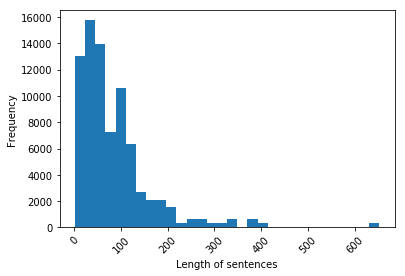

In [48]:
np.random.seed(42)
x = len_sentences2
plt.hist(x, density=False, bins=30)  # `density=False` would make counts
plt.ylabel('Frequency')
plt.xlabel('Length of sentences')
plt.xticks(rotation=45)

In [49]:
np.mean(np.array(len_sentences2))

82.20610687022901

## Tokenizing sentences - TEST WITH 110727.ann and 110727.tx

In [18]:
test_sent_tokenize = sent_tokenize(text) 

In [31]:
for sentence in test_sent_tokenize:
    print("NEW SENTENCE")
    print(sentence)
    print(" ")

NEW SENTENCE
Admission Date:  [**2202-1-8**]              Discharge Date:   [**2202-2-1**]

Date of Birth:  [**2163-9-18**]             Sex:   M

Service: MEDICINE

Allergies:
Keflex / Orencia / Remicade

Attending:[**First Name3 (LF) 2751**]
Chief Complaint:
L leg pain and erythema

Major Surgical or Invasive Procedure:
IR guided fluid drainage
Incision and drainage
Muscle biopsy


History of Present Illness:
 Mr. [**Known lastname 17385**] is a 38 y.o.
 
NEW SENTENCE
male with a history of psoriatic
arthritis on immunosuppresive therapy, HTN, HL, DM, cervicogenic
headaches who was recently discharged on [**1-8**] for left leg pain.
 
NEW SENTENCE
Pt reprots that he presented to the ED on [**2202-1-3**] for L heel pain
radiating to knees.
 
NEW SENTENCE
He was initially treated with vanc and cipro
for question of septic left knee; the aspirate showed [**Numeric Identifier **] WBC
and 94% PMN but neg gram stain and culture and no crystals so
abx discontinued.
 
NEW SENTENCE
LENI was ne

In [37]:
len_sentences = [len(sentence) for sentence in test_sent_tokenize]

(array([-200.,    0.,  200.,  400.,  600.,  800., 1000., 1200., 1400.,
        1600., 1800.]), <a list of 11 Text xticklabel objects>)

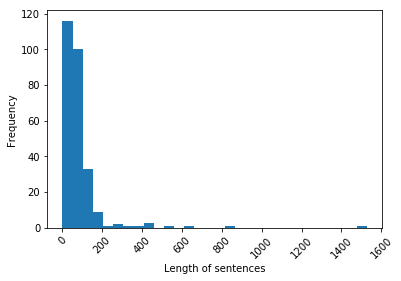

In [38]:
np.random.seed(42)
x = len_sentences
plt.hist(x, density=False, bins=30)  # `density=False` would make counts
plt.ylabel('Frequency')
plt.xlabel('Length of sentences')
plt.xticks(rotation=45)

In [43]:
np.mean(np.array(len_sentences))

79.96296296296296

### Post processing of sentences - TEST WITH 110727.ann and 110727.txt :
- removing of sentences that are only dots or bullet numbers. 
- splitting sentences that contain paragraphs. 

In [57]:
new_sentences = [sentence.split("\n\n") for sentence in test_sent_tokenize]

#First pass
test_sent_tokenize2=[]
for sentence in test_sent_tokenize:
    new_sentence = sentence.split("\n\n")
    test_sent_tokenize2.extend(new_sentence)
    
#Second pass
test_sent_tokenize3=[]
for sentence in test_sent_tokenize2:
    if (sentence == ".") or re.match(r'\d*\.', sentence) is not None:
        pass
    else:
        sentence = sentence.strip()
        test_sent_tokenize3.append(sentence)


In [101]:
len_sentences3 = [len(sentence) for sentence in test_sent_tokenize3]

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.,  700.,
         800.]), <a list of 10 Text xticklabel objects>)

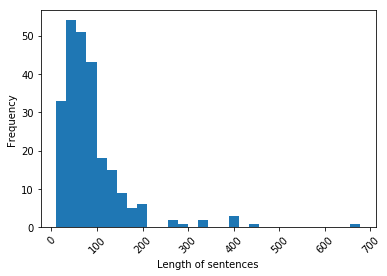

In [102]:
np.random.seed(42)
x = len_sentences3
plt.hist(x, density=False, bins=30)  # `density=False` would make counts
plt.ylabel('Frequency')
plt.xlabel('Length of sentences')
plt.xticks(rotation=45)

### Clean-up : remove new line characters from sentences - TEST with 110727.ann and 110727.txt

In [121]:
test_sent_tokenize_clean = [sentence.replace('\n', ' ') for sentence in test_sent_tokenize3]

### Linking relations -  TEST with 110727.ann and 110727.txt
According to documentation:
"When annotating a non-drug entity’s relationship to a drug entity, simply relate it to the ​closest occurrence​ of the drug mention. To determine the “closest” occurence, first check the same sentence; then look at nearby sentences and paragraphs. See the example below for clarification"

In our first iteration, we will only classify relations that are within the same sentence. As a second pass, we can concatenate two sentences if they are under 512 characters.

In [131]:
sentences = pd.DataFrame(test_sent_tokenize_clean)
sentences = sentences.rename(columns={0:"sentences"})

In [132]:
sentences.head()

,sentences
0,Admission Date: [**2202-1-8**] D...
1,Date of Birth: [**2163-9-18**] Se...
2,Service: MEDICINE
3,Allergies: Keflex / Orencia / Remicade
4,Attending:[**First Name3 (LF) 2751**] Chief Co...


#### Formatting annotations

In [111]:
#TURN THIS INTO A FUNCTION
#ann_df = pd.read_csv('110727.ann', sep="\t", header=None)
ann_df = pd.read_csv('195689.ann', sep="\t", header=None)

In [112]:
ann_df = ann_df.rename(columns={0:"tag", 1:"description", 2:"text"})

#Splitting concept entities and relations
# creating bool series for NaN values
null_entries = pd.isnull(ann_df["text"])
entries = pd.notnull(ann_df["text"])
# filtering data
rf_df = ann_df[null_entries]
tag_df = ann_df[entries]
rf_df = rf_df.rename(columns={'tag':"relation_id", 'description':"relation_description", 'text': 'relation_text'})
tag_df = tag_df.rename(columns={'tag':"concept_id", 'description':"concept_description", 'text': 'concept_text'})

#Enhacing rf_df
rf_df[['relation','arg1', 'arg2']] = rf_df['relation_description'].str.split(' ',expand=True)
rf_df[['arg1_delete','arg1_keep']] = rf_df['arg1'].str.split(':',expand=True)
rf_df[['arg2_delete','arg2_keep']] = rf_df['arg2'].str.split(':',expand=True)
rf_df = rf_df.drop(columns=['relation_text', 'arg1', 'arg2', 'arg1_delete', 'arg2_delete'])
rf_df = rf_df.rename(columns={'arg1_keep':"arg1", 'arg2_keep':"arg2"})
rf_df = pd.merge(rf_df, tag_df, left_on = 'arg1', right_on='concept_id')
rf_df = rf_df.rename(columns={'concept_id': 'arg1_id', 'concept_description':"arg1_description", 'concept_text':"arg1_text"})
rf_df = pd.merge(rf_df, tag_df, left_on = 'arg2', right_on='concept_id')
rf_df = rf_df.rename(columns={'concept_id': 'arg2_id', 'concept_description':"arg2_description", 'concept_text':"arg2_text"})
rf_df = rf_df.drop(columns=['arg1_id', 'arg2_id'])

dict_relation = {}
for sentence in sentences: 
    for i in range(len(rf_df)):
        arg1 = rf_df['arg1_text'][i]
        arg2 = rf_df['arg2_text'][i]
        relation = rf_df['relation'][i]
        dict_relation[(arg1, arg2)] = relation
        
        
list_relation_sentences = []
for i, j in itertools.product(list(dict_relation.keys()), sentences['sentences']):
    #print(i, j)
    if (i[0] in j) and (i[1] in j):
        list_relation_sentences.append((i, dict_relation[i], j))
        
train_df = pd.DataFrame(list_relation_sentences)
train_df = train_df.rename(columns={0:"args", 1:"relation", 2: "sentence"})

In [115]:
tag_df.head()

,concept_id,concept_description,concept_text
0,T1,Drug 10070 10077,insulin
1,T2,Drug 10097 10104,Humalog
2,T3,Form 10109 10114,units
4,T4,Drug 10175 10181,Lantus
5,T5,Strength 10182 10188,2units


In [114]:
rf_df.head()

,relation_id,relation_description,relation,arg1,arg2,arg1_description,arg1_text,arg2_description,arg2_text
0,R1,Form-Drug Arg1:T3 Arg2:T2,Form-Drug,T3,T2,Form 10109 10114,units,Drug 10097 10104,Humalog
1,R2,Strength-Drug Arg1:T5 Arg2:T4,Strength-Drug,T5,T4,Strength 10182 10188,2units,Drug 10175 10181,Lantus
2,R3,Route-Drug Arg1:T7 Arg2:T6,Route-Drug,T7,T6,Route 10417 10421,oral,Drug 10403 10410,insulin
3,R4,Strength-Drug Arg1:T10 Arg2:T11,Strength-Drug,T10,T11,Strength 10981 10984,5mg,Drug 10989 11009,Metoprolol succinate
4,R5,Strength-Drug Arg1:T23 Arg2:T22,Strength-Drug,T23,T22,Strength 11979 11985,162 mg,Drug 11971 11978,Aspirin


In [245]:
train_df.head()

,args,relation,sentence
0,"(60mg, Prednisone)",Strength-Drug,Medications on Admission: Prednisone 60mg PO d...
1,"(PO, Prednisone)",Route-Drug,Medications on Admission: Prednisone 60mg PO d...
2,"(PO, Prednisone)",Route-Drug,Prednisone 20 mg Tablet Sig: One (1) Tablet PO...
3,"(daily, Prednisone)",Frequency-Drug,Medications on Admission: Prednisone 60mg PO d...
4,"(35mg, Alendronate)",Strength-Drug,Medications on Admission: Prednisone 60mg PO d...


In [246]:
train_df.head()

,args,relation,sentence
0,"(60mg, Prednisone)",Strength-Drug,Medications on Admission: Prednisone 60mg PO d...
1,"(PO, Prednisone)",Route-Drug,Medications on Admission: Prednisone 60mg PO d...
2,"(PO, Prednisone)",Route-Drug,Prednisone 20 mg Tablet Sig: One (1) Tablet PO...
3,"(daily, Prednisone)",Frequency-Drug,Medications on Admission: Prednisone 60mg PO d...
4,"(35mg, Alendronate)",Strength-Drug,Medications on Admission: Prednisone 60mg PO d...


# Processing training data for BERT

## Sentence tokenizing

In [5]:
text_directory = sorted(glob.glob("*.txt"))
ann_directory = sorted(glob.glob("*.ann"))
list_files=[]
for file in text_directory:
    with open(file, 'rb') as f:
        text=f.read().decode("utf-8")
        list_files.append(text)

In [6]:
print(text_directory[0:10])
print(ann_directory[0:10])
print(len(list_files))

['100035.txt', '100039.txt', '100187.txt', '100229.txt', '100564.txt', '100579.txt', '100590.txt', '100677.txt', '100847.txt', '100883.txt']
['100035.ann', '100039.ann', '100187.ann', '100229.ann', '100564.ann', '100579.ann', '100590.ann', '100677.ann', '100847.ann', '100883.ann']
303


In [7]:
def sentence_tokenization(text):
    '''Splitting discharge summaries into sentences. Because discharge summaries are not consistently organized,
    extra processing is done to clean-up sentences and phrases. Chunks of texts are kept together to avoid splitting
    phrases too granularly'''
    #Using NLTK's sent_tokenize 
    sentence_tokens = sent_tokenize(text) 
    
    #Splititng paragraphs
    sentence_tokens2 = [paragraph for sentence in sentence_tokens for paragraph in sentence.split("\n\n\n")]
        
    #Removing sentences that are too short: only one dot (.) or a numerical bullet point (1., 2., 3.., ...10., etc.)    
    sentence_tokens3 = [sentence.strip() for sentence in sentence_tokens2 if (sentence != ".") or (re.match(r'\d*\.', sentence) is None)]

    #Cleaning up line breaks and replacing them with empty spaces
    sentence_tokens_clean = [sentence.replace('\n', ' ') for sentence in sentence_tokens3]
    
    #Saving results as dataframe 
    #sentences = pd.DataFrame(sentence_tokens_clean)
    #sentences = sentences.rename(columns={0:"sentences"})
    
    return sentence_tokens_clean

In [8]:
#100035.txt and 100039.txt
for file in list_files[0:2]:
    print(sentence_tokenization(file)[0])
    sentences = sentence_tokenization(file)

Admission Date:  [**2115-2-22**]              Discharge Date:   [**2115-3-19**]  Date of Birth:  [**2078-8-9**]             Sex:   M  Service: MEDICINE  Allergies: Vicodin  Attending:[**First Name3 (LF) 4891**] Chief Complaint: Post-cardiac arrest, asthma exacerbation  Major Surgical or Invasive Procedure: Intubation Removal of chest tubes placed at an outside hospital R CVL placement
Admission Date:  [**2174-4-18**]              Discharge Date:   [**2174-5-17**]  Date of Birth:  [**2135-11-15**]             Sex:   F  Service: MEDICINE  Allergies: Prochlorperazine / Heparin Agents  Attending:[**First Name3 (LF) 3918**] Chief Complaint: Abdominal Pain  Major Surgical or Invasive Procedure: Upper GI series with small bowel follow through Right heart catheterization IR guided paracentesis


## Linking with relations

In [9]:
def annotations_processing(file):
    '''This function processes the annotation files into dataframes (relation and concept). 
    It then combines these dataframes to create an enhanced relations dictionary'''
    
    #Reading the annotation file into a combined dataframe. 
    ann_df = pd.read_csv(file, sep="\t", header=None)
    ann_df = ann_df.rename(columns={0:"tag", 1:"description", 2:"text"})

    #Splitting concept entities and relations
    #Relations dataframe
    null_entries = pd.isnull(ann_df["text"])
    rf_df = ann_df[null_entries]
    rf_df = rf_df.rename(columns={'tag':"relation_id", 'description':"relation_description", 'text': 'relation_text'})
    #Cleaning up
    rf_df[['relation','arg1', 'arg2']] = rf_df['relation_description'].str.split(' ',expand=True)
    rf_df[['arg1_delete','arg1_keep']] = rf_df['arg1'].str.split(':',expand=True)
    rf_df[['arg2_delete','arg2_keep']] = rf_df['arg2'].str.split(':',expand=True)
    rf_df = rf_df.drop(columns=['relation_text', 'arg1', 'arg2', 'arg1_delete', 'arg2_delete'])
    rf_df = rf_df.rename(columns={'arg1_keep':"arg1", 'arg2_keep':"arg2"})
    
    #Concepts dataframe
    entries = pd.notnull(ann_df["text"])
    tag_df = ann_df[entries]
    tag_df = tag_df.rename(columns={'tag':"concept_id", 'description':"concept_description", 'text': 'concept_text'})

    #Combining relations and tags dataframes to create an enhanced relations dataframe
    rf_df = pd.merge(rf_df, tag_df, left_on = 'arg1', right_on='concept_id')
    rf_df = rf_df.rename(columns={'concept_id': 'arg1_id', 'concept_description':"arg1_description", 'concept_text':"arg1_text"})
    rf_df = pd.merge(rf_df, tag_df, left_on = 'arg2', right_on='concept_id')
    rf_df = rf_df.rename(columns={'concept_id': 'arg2_id', 'concept_description':"arg2_description", 'concept_text':"arg2_text"})
    rf_df = rf_df.drop(columns=['arg1_id', 'arg2_id'])

    #Creating a relations dictionary
    #Note that there could be "duplicate" relations that we will have to re-identify later. 
    dict_relation = {}
    for sentence in sentences: 
        for i in range(len(rf_df)):
            arg1 = rf_df['arg1_text'][i]
            arg2 = rf_df['arg2_text'][i]
            relation = rf_df['relation'][i]
            dict_relation[(arg1, arg2)] = relation
    return dict_relation

In [10]:
list_relations = [annotations_processing(file) for file in ann_directory]
len(list_relations)

303

In [11]:
#Defining an empty dataframe to store our results 
train_all = pd.DataFrame(columns = ['args', 'relation', 'sentence'])

#We will have to make sure that we identify how to tag the data with subject start/end, and object start/end


In [66]:
file_num=0
relation_sentences=[]
errors= 0
for file in list_files:
    
    #print(file)
    #implementing sentence tokenization
    sentences = np.array(sentence_tokenization(file))
    print("original length", len(sentences))
    #listing entities that make up relations
    list_entities = list(list_relations[file_num].keys())
    #print(len(list_entities))
    
    #looking for relation tags in sentences and pulling out sentences. 
    for e in list_entities:
            #print(e)
        
        new_e = e
        arg1_indices = np.where(np.char.find(sentences, new_e[0])>=0)[0]
        if arg1_indices.size==0: 
            #print(e[0])
            new_e = list(new_e)
            new_e[0] = new_e[0].replace(' ', '')
            new_e = tuple(new_e)
            arg1_indices = np.where(np.char.find(sentences, new_e[0])>=0)[0]

        arg2_indices = np.where(np.char.find(sentences, new_e[1])>=0)[0]
        if arg2_indices.size==0: 
            #print(e[1])
            new_e = list(new_e)
            new_e[1] = new_e[1].replace(' ', '')
            new_e = tuple(new_e)
            arg2_indices = np.where(np.char.find(sentences, new_e[1])>=0)[0]

            #extract where minimum. 
        combinations = [(i,j,abs(i-j)) for i,j in list(itertools.product(arg1_indices, arg2_indices))]
        try:
            min_distance = min(combinations, key = lambda t: t[2])[2]
        except ValueError:
            min_distance = "none"
        if min_distance != "none":
            min_combinations = [(t[0], t[1]) for t in combinations if t[2] == min_distance]
            for c in min_combinations:
                if c[0]==c[1]:
                    include_sentence = sentences[c[0]]
                    include_sentence = include_sentence.replace(new_e[0], ("SUB_B " + new_e[0] + " SUB_E"))
                    include_sentence = include_sentence.replace(new_e[1], ("OBJ_B " + new_e[1] + " OBJ_E"))
                    relation_sentences.append((new_e, list_relations[file_num][e], include_sentence))
                    sentences.tolist().pop(c[0])
                elif c[0]!=c[1]:
                    include_sentence = sentences[c[0]] + " " + sentences[c[1]]
                    include_sentence = include_sentence.replace(new_e[0], ("SUB_B " + new_e[0] + " SUB_E"))
                    include_sentence = include_sentence.replace(new_e[1], ("OBJ_B " + new_e[1] + " OBJ_E"))
                    relation_sentences.append((new_e, list_relations[file_num][e], include_sentence))
                    sentences.tolist().pop(c[0])
                    sentences.tolist().pop(c[1])
                    
        #except ValueError:
        #    print("failed on file number:", file_num, text_directory[file_num], e, new_e[0], new_e[1], "arg1:", arg1_indices, "arg2:", arg2_indices, "min:", min_combinations)
        #    errors+=1
    for s in range(len(sentences)):
        relation_sentences.append(("none", "no relation", sentences[s]))   
    print("output length", len(relation_sentences))
    
    file_num+=1

original length 200
output length 404
original length 274
output length 888
original length 251
output length 1427
original length 242
output length 1799
original length 85
output length 1934
original length 135
output length 2282
original length 142
output length 2764
original length 139
output length 3044
original length 178
output length 3392
original length 115
output length 3571
original length 127
output length 3748
original length 232
output length 4174
original length 96
output length 4293
original length 93
output length 4443
original length 130
output length 4673
original length 134
output length 4967
original length 98
output length 5233
original length 118
output length 5573
original length 49
output length 5674
original length 67
output length 5756
original length 109
output length 5952
original length 106
output length 6162
original length 85
output length 6363
original length 154
output length 6604
original length 216
output length 6886
original length 128
output length 

output length 53894
original length 70
output length 54034
original length 68
output length 54155
original length 92
output length 54332
original length 328
output length 54801
original length 183
output length 55154
original length 85
output length 55336
original length 203
output length 55659
original length 204
output length 55984
original length 108
output length 56239
original length 68
output length 56355
original length 91
output length 56493
original length 251
output length 56992
original length 32
output length 57050
original length 130
output length 57255
original length 199
output length 57845
original length 68
output length 58041
original length 94
output length 58203
original length 93
output length 58351
original length 200
output length 58654
original length 75
output length 58755
original length 124
output length 58924
original length 141
output length 59197
original length 19
output length 59219
original length 121
output length 59452
original length 119
output lengt

In [67]:
len(relation_sentences)

76318

In [72]:
train_df = pd.DataFrame(relation_sentences)
train_df = train_df.rename(columns={0:"args", 1:"relation", 2: "sentence"})

In [73]:
train_df.head()

,args,relation,sentence
0,"(recurrent seizures, ativan)",Reason-Drug,He also may have SUB_B recurrent seizures SUB_...
1,"(IM, ativan)",Route-Drug,He also may have recurrent seizures which shou...
2,"(IV, ativan)",Route-Drug,He also may have recurrent seizures which shou...
3,"(25mg, Topiramate)",Strength-Drug,-patient will be on OBJ_B Topiramate OBJ_E SUB...
4,"(PO, Topiramate)",Route-Drug,-patient will be on OBJ_B Topiramate OBJ_E 25m...


In [77]:
train_df['relation'].value_counts()

no relation       40955
Strength-Drug      6781
Frequency-Drug     6484
Route-Drug         5925
Reason-Drug        5263
Form-Drug          4643
Dosage-Drug        4455
ADE-Drug           1167
Duration-Drug       645
Name: relation, dtype: int64

In [79]:
print("Percentage without a relation:", 40955*100/len(train_df))

Percentage without a relation: 53.66361801934013
